In [1]:
import logging
logging.basicConfig(level=logging.INFO)

import numpy as np
import pandas as pd
pd.set_option("display.min_rows", 100)

from PIL import Image
from IPython.display import display


# Before You Start

Install the package (and extras this notebook needs) **before** running cells:

```bash
# from a local checkout (recommended)
uv sync --extra torch --extra tensorflow --extra notebooks

# or via pip
pip install "cv-pipeliner[torch,tensorflow,notebooks] @ git+https://github.com/epoch8/cv-pipeliner"
```

What each extra unlocks in this notebook:

- `notebooks` — Jupyter / `ipykernel` (select the project `.venv` as the kernel)
- `torch` — YOLOv8 detection, segmentation, and pipeline sections (Ultralytics)
- `tensorflow` — MobileNetV2 classification section

Supported Python: `>=3.9,<3.14`.

Core data / visualization cells (including keypoints visibility) need only the base package.


# Image Data Classes

In [2]:
from cv_pipeliner import BboxData, ImageData

- Each image is represented by one `ImageData`; each bounding box inside an image is represented by one `BboxData`.

In [3]:
from pathlib import Path
from urllib.request import urlretrieve
from zipfile import ZipFile
import json

MAIN_DIR = Path('.').absolute()
DATA_DIR = MAIN_DIR / 'examples'
DATA_DIR.mkdir(exist_ok=True)

COCO_EXAMPLE_URLS = {
    'train': [
        'http://images.cocodataset.org/train2017/000000000009.jpg',
        'http://images.cocodataset.org/train2017/000000000025.jpg',
        'http://images.cocodataset.org/train2017/000000000030.jpg',
        'http://images.cocodataset.org/train2017/000000000034.jpg',
        'http://images.cocodataset.org/train2017/000000000036.jpg',
    ],
    'val': [
        'http://images.cocodataset.org/val2017/000000000139.jpg',
        'http://images.cocodataset.org/val2017/000000000285.jpg',
        'http://images.cocodataset.org/val2017/000000000632.jpg',
        'http://images.cocodataset.org/val2017/000000000724.jpg',
        'http://images.cocodataset.org/val2017/000000000776.jpg',
    ],
}

for split, urls in COCO_EXAMPLE_URLS.items():
    split_dir = DATA_DIR / split
    split_dir.mkdir(exist_ok=True)
    for url in urls:
        image_path_to_download = split_dir / Path(url).name
        if not image_path_to_download.exists():
            urlretrieve(url, image_path_to_download)

annotations_zip_path = DATA_DIR / 'annotations_trainval2017.zip'
annotations_dir = DATA_DIR / 'annotations'
if not annotations_zip_path.exists():
    urlretrieve('http://images.cocodataset.org/annotations/annotations_trainval2017.zip', annotations_zip_path)

with ZipFile(annotations_zip_path) as zf:
    for annot_name in ['instances_train2017.json', 'instances_val2017.json']:
        annot_path = annotations_dir / annot_name
        if not annot_path.exists():
            zf.extract(f'annotations/{annot_name}', DATA_DIR)

image_paths = sorted(DATA_DIR.glob('*/*.jpg'))

In [4]:
image_path = DATA_DIR / 'train' / '000000000025.jpg'
image_path


PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000025.jpg')

# How to Create `ImageData` or `BboxData` with Partial Manual Annotation

In [5]:
# These numbers are copied from official COCO train2017 annotations for image_id=25
# (annotation ids: 598548 and 599491). Keypoints below are manual illustrative points
# placed on meaningful parts of the giraffes: head, neck, body, and legs.
xmin1, ymin1, xmax1, ymax1 = 386, 60, 600, 357
label1 = 'giraffe'
keypoints1 = [
    (397, 64),   # head / ossicones
    (410, 121),  # upper neck
    (454, 172),  # shoulder
    (520, 226),  # body center
    (438, 353),  # front leg / hoof
    (550, 344),  # rear leg / hoof
]
mask1 = [
    [
        [438, 353], [438, 327], [434, 306], [427, 287], [427, 280], [425, 266],
        [418, 256], [417, 249], [428, 235], [429, 224], [426, 212], [416, 192],
        [414, 182], [414, 170], [412, 168], [411, 165], [411, 150], [406, 121],
        [400, 107], [393, 109], [387, 101], [386, 100], [386, 93], [387, 88],
        [386, 85], [387, 81], [393, 68], [395, 60], [396, 60], [399, 66],
        [399, 68], [400, 71], [404, 69], [408, 62], [409, 61], [413, 63],
        [410, 73], [410, 77], [414, 82], [419, 81], [424, 78], [425, 80],
        [419, 87], [414, 93], [432, 128], [443, 158], [453, 172], [466, 179],
        [482, 198], [497, 214], [520, 226], [536, 252], [542, 269], [544, 273],
        [562, 285], [590, 294], [599, 297], [600, 321], [589, 319], [586, 314],
        [583, 304], [579, 297], [554, 285], [544, 279], [544, 312], [544, 325],
        [552, 343], [550, 348], [533, 347], [524, 348], [512, 349], [507, 350],
        [489, 305], [478, 296], [477, 295], [470, 340], [469, 355], [441, 356],
        [440, 357], [438, 357],
    ]
]

xmin2, ymin2, xmax2, ymax2 = 53, 356, 185, 412
label2 = 'giraffe'
keypoints2 = [
    (158, 370),  # head
    (145, 381),  # neck
    (122, 374),  # body center
    (73, 391),   # back/body
    (99, 406),   # visible legs / lower body
]
mask2 = [
    [
        [99, 406], [134, 394], [145, 381], [158, 370], [173, 389], [181, 391],
        [182, 391], [185, 382], [172, 360], [147, 356], [134, 366], [125, 374],
        [107, 378], [83, 383], [72, 391], [60, 399], [53, 410], [65, 412], [98, 406],
    ]
]


In [6]:
image_data_example_with_part_annot = ImageData(
    image_path=image_path,
    bboxes_data=[
        BboxData(
            image_path=image_path,
            xmin=xmin1,
            ymin=ymin1,
            xmax=xmax1,
            ymax=ymax1,
            label=label1,
            keypoints=keypoints1,
            mask=mask1,
        ),
        BboxData(
            image_path=image_path,
            xmin=xmin2,
            ymin=ymin2,
            xmax=xmax2,
            ymax=ymax2,
            label=label2,
            keypoints=keypoints2,
            mask=mask2,
        ),
    ],
    keypoints=[
        (397, 64),   # main giraffe head
        (520, 226),  # main giraffe body
        (158, 370),  # small giraffe head
    ],
)


In [7]:
image_data_example_with_part_annot

ImageData(image_path=PathlibPathEx('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000025.jpg'), label=None, keypoints=array([[397,  64],
       [520, 226],
       [158, 370]]), keypoints_visibility=None, keypoints_scores=None, detection_score=None, classification_score=None, additional_info={}, meta_width=None, meta_height=None, bboxes_data=[BboxData(image_path=PathlibPathEx('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000025.jpg'), label='giraffe', keypoints=array([[397,  64],
       [410, 121],
       [454, 172],
       [520, 226],
       [438, 353],
       [550, 344]]), keypoints_visibility=None, keypoints_scores=None, detection_score=None, classification_score=None, additional_info={}, meta_width=None, meta_height=None, xmin=386, ymin=60, xmax=600, ymax=357, additional_bboxes_data=[]), BboxData(image_path=PathlibPathEx('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000025.jpg'), label='giraffe', keypoints=

# How to Visualize `ImageData` and `BboxData`

### Several Options:

In [8]:
from cv_pipeliner import visualize_image_data

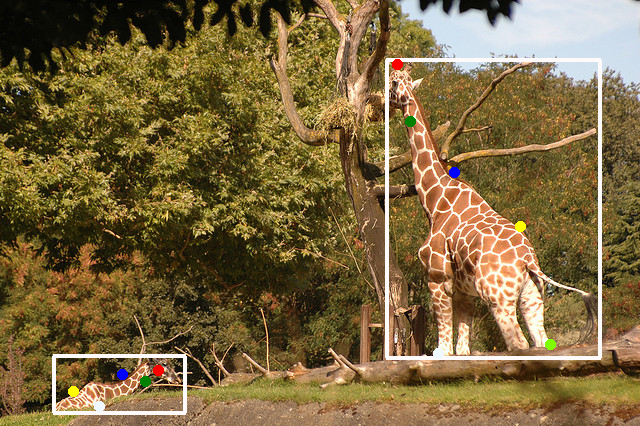

In [9]:
Image.fromarray(visualize_image_data(image_data_example_with_part_annot))

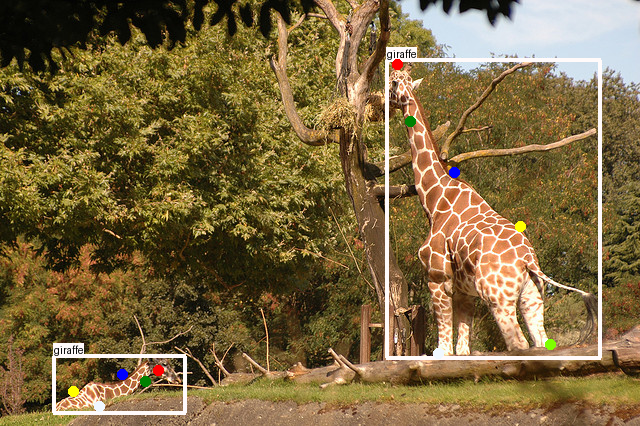

In [10]:
Image.fromarray(visualize_image_data(image_data_example_with_part_annot, include_labels=True))

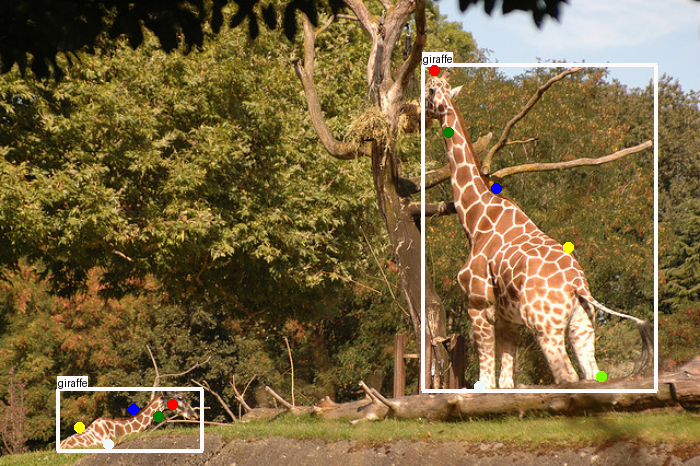

In [11]:
visualize_image_data(image_data_example_with_part_annot, include_labels=True, return_as_pil_image=True, thumbnail_size=700)

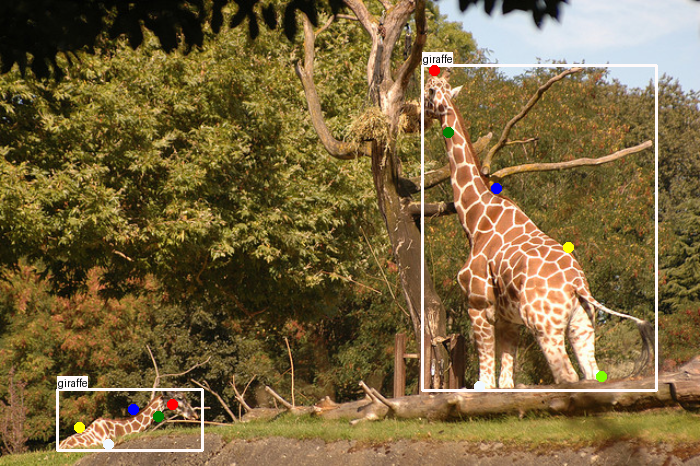

In [12]:
visualize_image_data(
    image_data_example_with_part_annot, include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=3
)

## Keypoints Visibility (COCO flags)

`BboxData` / `ImageData` accept `keypoints_visibility` — COCO visibility flags per keypoint:

- `0` (`KeypointVisibility.NOT_LABELED`) — not drawn
- `1` (`KeypointVisibility.LABELED_NOT_VISIBLE`) — **outline only** (empty circle; no fill / no alpha)
- `2` (`KeypointVisibility.LABELED_AND_VISIBLE`) — filled circle

`visualize_image_data(..., include_keypoints_visibility=True)` is the default and respects these flags.
Pass `include_keypoints_visibility=False` to draw every keypoint filled as-is (flags ignored).


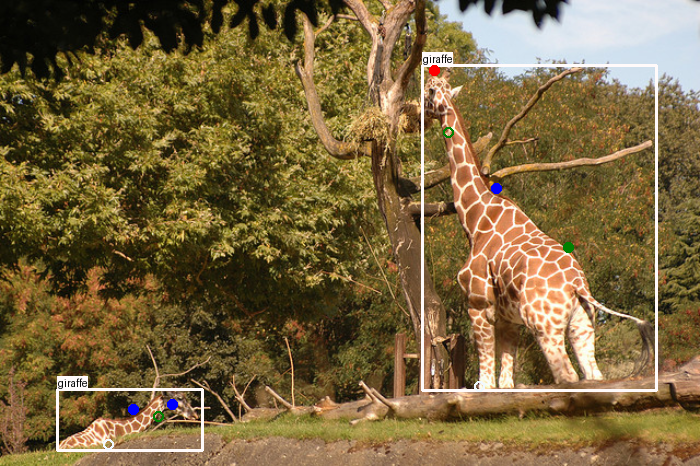

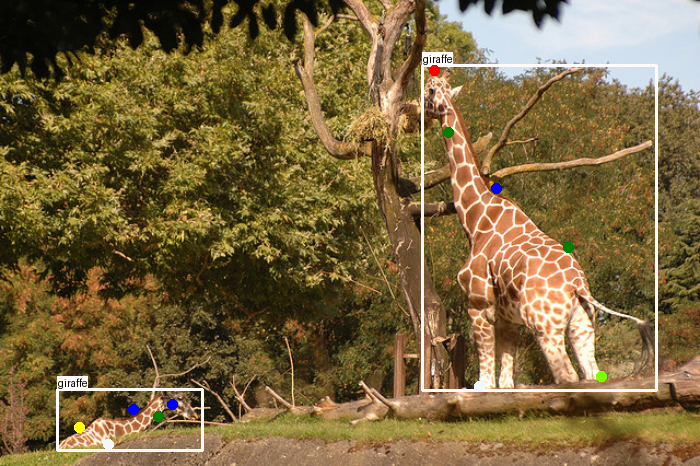

In [13]:
from copy import deepcopy
from cv_pipeliner import KeypointVisibility

image_data_with_visibility = deepcopy(image_data_example_with_part_annot)
# First bbox: skip / outline / filled / filled / outline / skip
image_data_with_visibility.bboxes_data[0].keypoints_visibility = [
    KeypointVisibility.NOT_LABELED,           # 0 — skipped
    KeypointVisibility.LABELED_NOT_VISIBLE,   # 1 — outline only
    KeypointVisibility.LABELED_AND_VISIBLE,   # 2 — filled
    KeypointVisibility.LABELED_AND_VISIBLE,
    KeypointVisibility.LABELED_NOT_VISIBLE,
    KeypointVisibility.NOT_LABELED,
]
# Second bbox: mix of outline and filled
image_data_with_visibility.bboxes_data[1].keypoints_visibility = [
    KeypointVisibility.LABELED_AND_VISIBLE,
    KeypointVisibility.LABELED_NOT_VISIBLE,
    KeypointVisibility.LABELED_AND_VISIBLE,
    KeypointVisibility.NOT_LABELED,
    KeypointVisibility.LABELED_NOT_VISIBLE,
]

display(
    visualize_image_data(
        image_data_with_visibility,
        include_labels=True,
        include_keypoints=True,
        include_keypoints_visibility=True,  # default
        return_as_pil_image=True,
        thumbnail_size=700,
        fontsize=16,
        thickness=3,
    )
)
display(
    visualize_image_data(
        image_data_with_visibility,
        include_labels=True,
        include_keypoints=True,
        include_keypoints_visibility=False,  # draw all keypoints filled
        return_as_pil_image=True,
        thumbnail_size=700,
        fontsize=16,
        thickness=3,
    )
)


## You Can Also Draw Masks, Including Masks with Holes

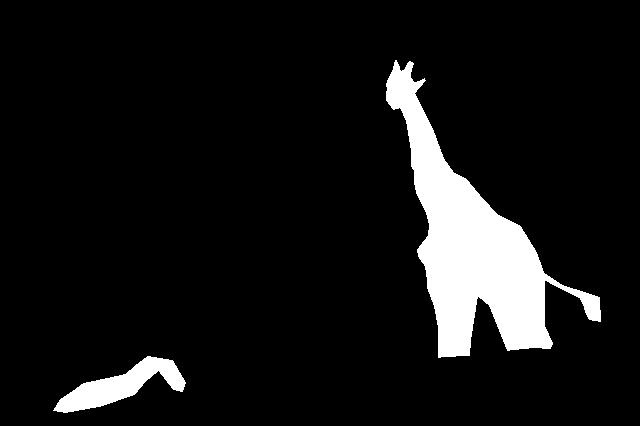

In [14]:
Image.fromarray(image_data_example_with_part_annot.open_mask())

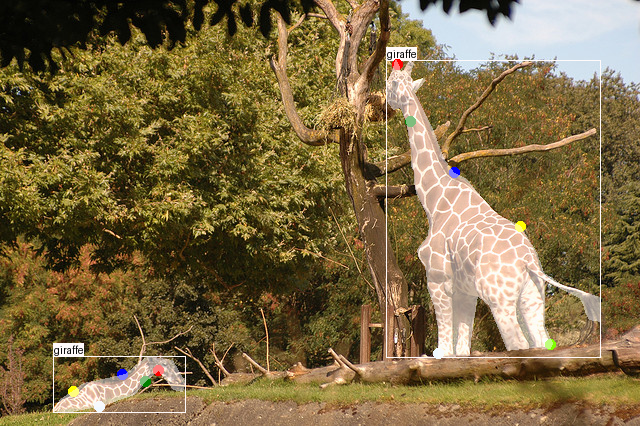

In [15]:
visualize_image_data(
    image_data_example_with_part_annot, include_labels=True, return_as_pil_image=True,
    fontsize=16, thickness=1, include_mask=True
)

### How to Crop Bounding Boxes

(386, 60, 600, 357)
(386, 60, 600, 357)
label: giraffe


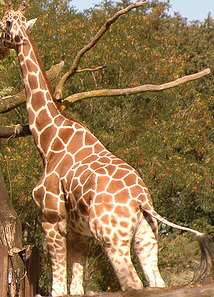

===
(53, 356, 185, 412)
(53, 356, 185, 412)
label: giraffe


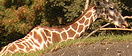

===


In [16]:
for bbox_data in image_data_example_with_part_annot.bboxes_data:
    print((bbox_data.xmin, bbox_data.ymin, bbox_data.xmax, bbox_data.ymax))
    print(bbox_data.coords)
    print("label:", bbox_data.label)
    cropped_image = bbox_data.open_cropped_image()  # returns np.array
    display(Image.fromarray(cropped_image))
    print("===")

### You Can Also Crop Bounding Boxes with an Offset

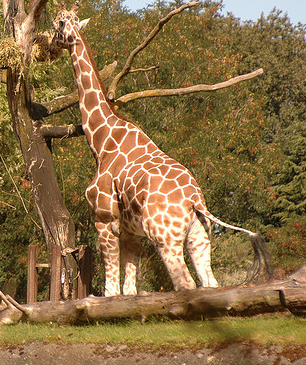

===


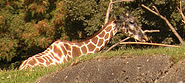

===


In [17]:
for bbox_data in image_data_example_with_part_annot.bboxes_data:
    cropped_image = bbox_data.open_cropped_image(
        xmin_offset=0.25,
        ymin_offset=0.25,
        xmax_offset=0.25,
        ymax_offset=0.25
    )  # returns np.array
    display(Image.fromarray(cropped_image))
    print("===")

(386, 60, 600, 357)
(386, 60, 600, 357)
label: giraffe


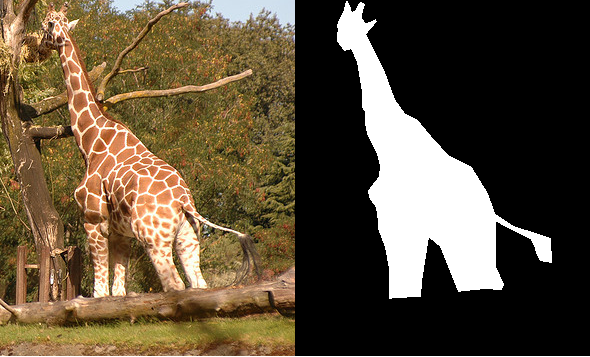

===
(53, 356, 185, 412)
(53, 356, 185, 412)
label: giraffe


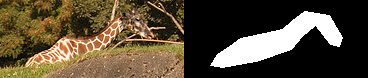

===


In [18]:
from cv_pipeliner.utils.images import concat_images

for bbox_data in image_data_example_with_part_annot.bboxes_data:
    print((bbox_data.xmin, bbox_data.ymin, bbox_data.xmax, bbox_data.ymax))
    print(bbox_data.coords)
    print("label:", bbox_data.label)
    cropped_image = bbox_data.open_cropped_image(
        xmin_offset=0.2, ymin_offset=0.2, xmax_offset=0.2, ymax_offset=0.2
    )  # returns np.array
    mask = bbox_data.open_cropped_mask(
        xmin_offset=0.2, ymin_offset=0.2, xmax_offset=0.2, ymax_offset=0.2
    )  # returns np.array
    image = concat_images(cropped_image, mask)
    display(Image.fromarray(image))
    print("===")

### You Can Also Open `BboxData` as a Separate `ImageData`

ImageData(image_path=None, label='giraffe', keypoints=array([[ 64,   4],
       [ 77,  61],
       [121, 112],
       [187, 166],
       [105, 293],
       [217, 284]]), keypoints_visibility=None, keypoints_scores=None, detection_score=None, classification_score=None, additional_info={}, meta_width=306, meta_height=365, bboxes_data=[])

array([[[175, 161, 100],
        [205, 184, 119],
        [178, 149,  83],
        ...,
        [207, 220, 236],
        [207, 220, 236],
        [207, 220, 236]],

       [[186, 169,  99],
        [180, 153, 106],
        [194, 162, 113],
        ...,
        [207, 220, 236],
        [207, 220, 236],
        [207, 220, 236]],

       [[165, 144,  87],
        [148, 121,  74],
        [167, 139,  91],
        ...,
        [207, 220, 236],
        [207, 220, 236],
        [207, 220, 236]],

       ...,

       [[163, 129,  94],
        [177, 144, 111],
        [151, 118,  87],
        ...,
        [141, 110,  82],
        [147, 113,  88],
        [140, 106,  81]],

       [[144, 109,  77],
        [178, 145, 114],
        [171, 140, 111],
        ...,
        [136, 105,  76],
        [154, 120,  93],
        [140, 106,  78]],

       [[165, 130,  98],
        [160, 127,  96],
        [162, 128, 100],
        ...,
        [137, 107,  81],
        [126,  96,  72],
        [145, 115,  91]]

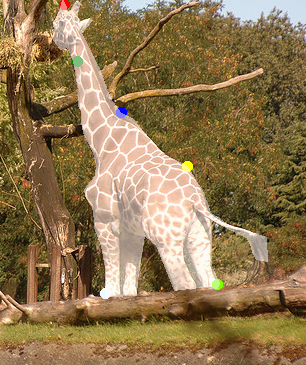

===


ImageData(image_path=None, label='giraffe', keypoints=array([[125,  28],
       [112,  39],
       [ 89,  32],
       [ 40,  49],
       [ 66,  64]]), keypoints_visibility=None, keypoints_scores=None, detection_score=None, classification_score=None, additional_info={}, meta_width=185, meta_height=83, bboxes_data=[])

array([[[120,  91,  31],
        [ 94,  79,  24],
        [ 96,  91,  33],
        ...,
        [144, 125,  95],
        [136, 118,  80],
        [139, 121,  99]],

       [[122,  88,  43],
        [ 90,  76,  15],
        [106, 107,  27],
        ...,
        [176, 158, 110],
        [176, 152, 124],
        [121, 101,  64]],

       [[101,  88,  35],
        [ 92,  80,  22],
        [ 92,  89,  20],
        ...,
        [141, 130,  68],
        [135, 117,  77],
        [151, 135,  86]],

       ...,

       [[168, 157,  77],
        [135, 139,  44],
        [158, 169,  67],
        ...,
        [149, 117,  94],
        [124,  91,  74],
        [127,  95,  70]],

       [[153, 148,  66],
        [159, 159,  61],
        [164, 167,  62],
        ...,
        [171, 139, 116],
        [118,  85,  76],
        [111,  78,  59]],

       [[117, 117,  21],
        [173, 170,  67],
        [174, 165,  70],
        ...,
        [189, 155, 127],
        [144, 113,  84],
        [161, 130, 102]]

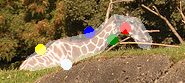

===


In [19]:
for bbox_data in image_data_example_with_part_annot.bboxes_data:
    cropped_image_data = bbox_data.open_cropped_image(
        xmin_offset=0.25,
        ymin_offset=0.25,
        xmax_offset=0.25,
        ymax_offset=0.25,
        return_as_image_data=True
    )  # returns ImageData; the cropped image is stored in cropped_image_data.image
    display(cropped_image_data)
    display(cropped_image_data.image)
    display(visualize_image_data(cropped_image_data, include_keypoints=True, include_mask=True, return_as_pil_image=True))
    print("===")

# How to Read Annotated Data

## From `image_data` JSON Format

In [20]:
image_paths = sorted(DATA_DIR.glob('*/*.jpg'))
image_paths

[PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000009.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000025.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000030.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000034.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000036.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000139.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000285.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000632.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000724.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000776.jpg')]

In [21]:
image_paths

[PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000009.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000025.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000030.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000034.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/train/000000000036.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000139.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000285.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000632.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000724.jpg'),
 PosixPath('/home/bobokvsky/datapipe-branch/cv-pipeliner/docs/examples/val/000000000776.jpg')]

In [22]:
from cv_pipeliner.data_converters import COCODataConverter

coco_converter = COCODataConverter()
images_data = []
for split in COCO_EXAMPLE_URLS:
    split_image_paths = [image_path for image_path in image_paths if image_path.parent.name == split]
    images_data.extend(
        coco_converter.get_images_data_from_annots(
            image_paths=split_image_paths,
            annots=annotations_dir / f'instances_{split}2017.json',
            disable_tqdm=True,
        )
    )

In [23]:
image_data_annotated = images_data[1]

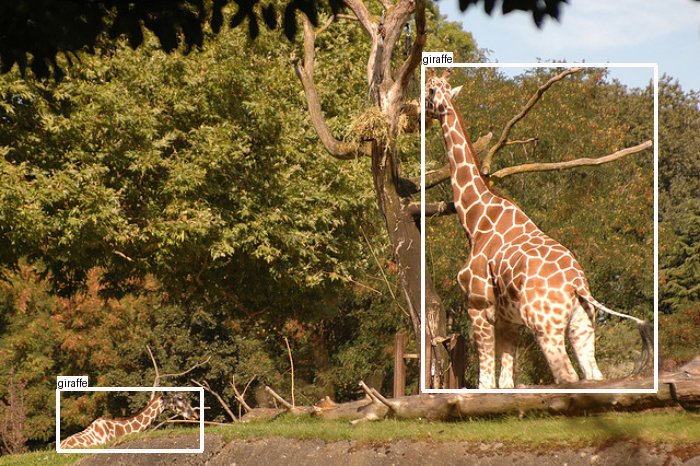

In [24]:
visualize_image_data(
    image_data_annotated, include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=4
)

# `ImageData` Transformations

`ImageData` can be transformed as a whole object: resize, crop, rotate, and thumbnail operations update not only the image but also related annotation fields such as `BboxData`, keypoints, masks, nested `additional_bboxes_data`, and image-size metadata.

This is useful for augmentations, crop preparation, pipeline debugging, and prediction postprocessing because you do not need to recalculate every coordinate manually.

In [25]:
from cv_pipeliner import (
    crop_image_data,
    resize_image_data,
    rotate_image_data,
    thumbnail_image_data,
    visualize_image_data,
)

Take one example from the COCO annotations above and apply several transformations. All functions return a copy of `ImageData`, so the original annotation remains unchanged. `image_path` is set to `None`, leave transformed image to field `image: np.ndarray`.

In [26]:
thumbnail_image_data_example = thumbnail_image_data(image_data_annotated, size=320)
resized_image_data = resize_image_data(image_data_annotated, size=(480, 480))
rotated_image_data = rotate_image_data(image_data_annotated, angle=15)
cropped_image_data = crop_image_data(
    image_data_annotated,
    xmin=80,
    ymin=40,
    xmax=560,
    ymax=420,
    allow_negative_and_large_coords=False,
    remove_bad_coords=True,
)

source (640, 426)


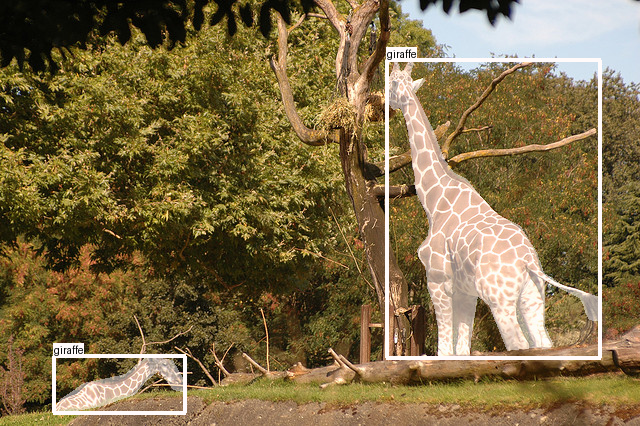

thumbnail (320, 213)


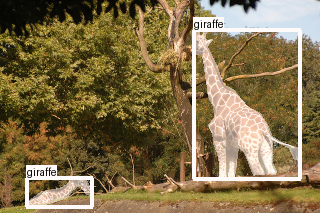

resized (480, 480)


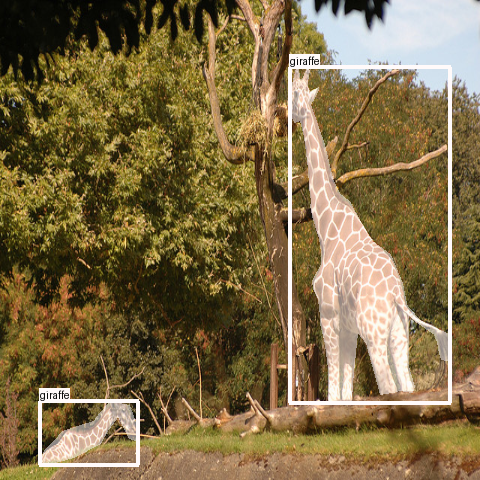

rotated (728, 577)


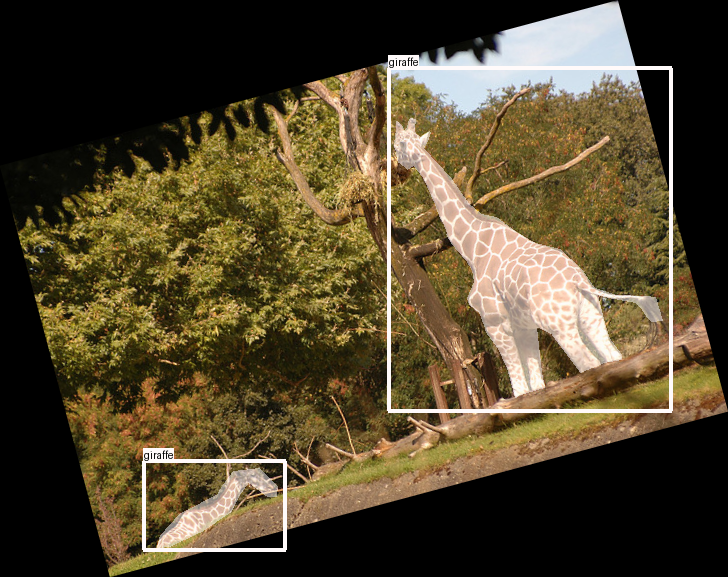

cropped (480, 380)


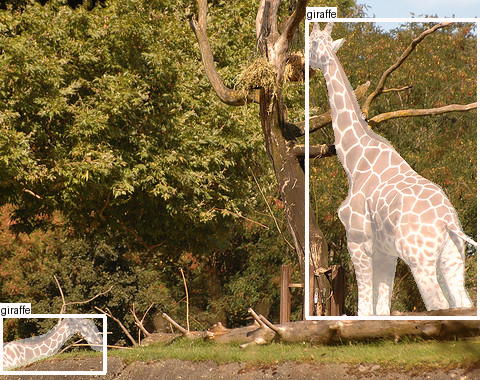

In [27]:
for title, transformed_image_data in [
    ("source", image_data_annotated),
    ("thumbnail", thumbnail_image_data_example),
    ("resized", resized_image_data),
    ("rotated", rotated_image_data),
    ("cropped", cropped_image_data),
]:
    print(
        title,
        transformed_image_data.get_image_size(),
    )
    display(visualize_image_data(
        transformed_image_data,
        include_labels=True,
        include_mask=True,
        include_keypoints=True,
        return_as_pil_image=True,
        fontsize=16,
        thickness=4,
    ))

---

# The image annotations above are loaded from official COCO JSON files via COCODataConverter.
# Every BboxData contains bbox coordinates and segmentation polygons.

- There are two kinds of objects for working with models: low-level and high-level objects (`Inferencer`, `BboxData`, `ImageData`, `BatchGenerator`).
- High-level detector and pipeline inferencers accept `BatchGeneratorImageData`; classification inferencers accept `BatchGeneratorBboxData`.
- High-level models can accept either the data itself or generators built from `ImageData` or `BboxData`.
- Generators open the required images automatically and always return copies of the corresponding objects.

In [28]:
from cv_pipeliner import BatchGeneratorImageData

In [29]:
images_data_gen = BatchGeneratorImageData(data=images_data, batch_size=3)

In [30]:
for i, images_data_batch in enumerate(images_data_gen):
    print(f"{i}th batch => {len(images_data_batch)} images")

0th batch => 3 images
1th batch => 3 images


2th batch => 3 images
3th batch => 1 images


In [31]:
# Standard YOLOv8 and MobileNet weights are downloaded by their libraries on first use.

# Detection without classes

In [32]:
MINIMUM_IOU = 0.5

# How to Load a Detection Model, Run Inference, Calculate Metrics, Visualize Results

### Loading the Model

### Paths Can Also Be Cloud Paths, Such as `gs://` or `s3://`

In [33]:
# Standard COCO detector from Ultralytics.
# The weights are downloaded automatically on first use.
from cv_pipeliner import YOLOv8_ModelSpec

DETECTION_MODEL_SPEC = YOLOv8_ModelSpec(model_path='yolov8n.pt')
DETECTION_SCORE_THRESHOLD = 0.25

In [34]:
from cv_pipeliner import YOLOv8_ModelSpec

### Loading the Inferencer and Running Inference

In [35]:
detection_inferencer = DETECTION_MODEL_SPEC.load_detection_inferencer()

In [36]:
pred_images_data_detection = detection_inferencer.predict(
    images_data_gen=images_data,  # or images_data_gen
    score_threshold=DETECTION_SCORE_THRESHOLD,
)

# to calculate the mAP metric
# raw_pred_images_data_detection = detection_inferencer.predict(
#     images_data_gen=images_data,  # or images_data_gen
#     score_threshold=0.
# )

  0%|                                                                                                             | 0/10 [00:00<?, ?it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:07<00:00,  1.31it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:07<00:00,  1.31it/s]

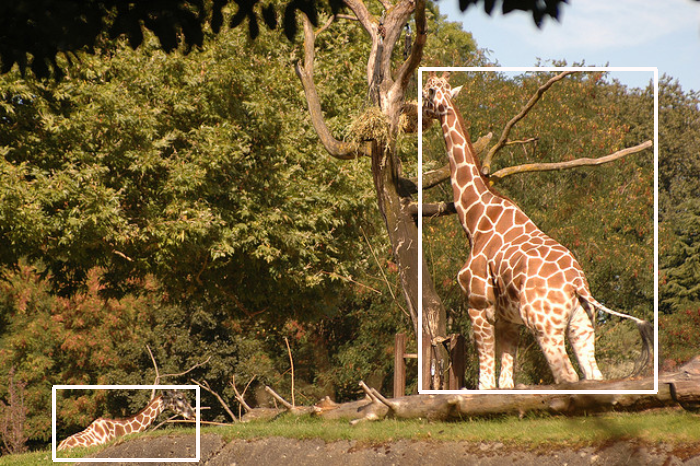

In [37]:
visualize_image_data(
    pred_images_data_detection[1], return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=4
)

### Calculating Metrics

In [38]:
from cv_pipeliner import get_df_detection_metrics

df_detection_metrics = get_df_detection_metrics(
    true_images_data=images_data,
    pred_images_data=pred_images_data_detection,
    minimum_iou=MINIMUM_IOU,
#     raw_pred_images_data=raw_pred_images_data_detection
)

In [39]:
df_detection_metrics

,value
images_support,10
support,61
TP,29
FP,12
FN,32
iou_mean,0.878666
accuracy,0.311828
precision,0.707317
recall,0.47541
f1_score,0.568627


# Classification

# How to Load a Classification Model, Run Inference, Calculate Metrics, and Visualize Results

In [40]:
cropped_images = [
    bbox_data.open_cropped_image(return_as_image_data=True)
    for image_data in images_data
    for bbox_data in image_data.bboxes_data
]
# Ideally, do not keep everything in memory; describe images by paths: ImageData(image_path=<path to image>)

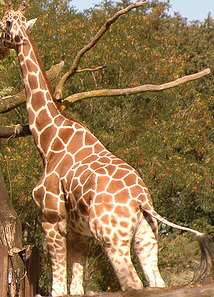

In [41]:
Image.fromarray(cropped_images[8].open_image())

### Loading the Model

In [42]:
import numpy as np
from cv_pipeliner import ClassificationInferencer, TensorFlow_ClassificationModelSpec

In [43]:
import tensorflow as tf
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, decode_predictions, preprocess_input

mobilenet_model = MobileNetV2(weights='imagenet')
imagenet_class_names = [decoded[0][1] for decoded in decode_predictions(np.eye(1000), top=1)]

CLASSIFICATION_MODEL_SPEC = TensorFlow_ClassificationModelSpec(
    input_size=(224, 224),
    model_path=mobilenet_model,
    class_names=imagenet_class_names,
    preprocess_input=lambda images: preprocess_input(
        np.array([tf.image.resize(image, (224, 224)).numpy() for image in images], dtype=np.float32)
    ),
    saved_model_type='tf.keras.Model',
)

I0000 00:00:1784731181.209559   54641 cudart_stub.cc:31] Could not find cuda drivers on your machine, GPU will not be used.


       0/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

   16384/14536120 ━━━━━━━━━━━━━━━━━━━━ 49s 3us/step

   49152/14536120 ━━━━━━━━━━━━━━━━━━━━ 1:03 4us/step

   90112/14536120 ━━━━━━━━━━━━━━━━━━━━ 42s 3us/step 

  147456/14536120 ━━━━━━━━━━━━━━━━━━━━ 40s 3us/step

  229376/14536120 ━━━━━━━━━━━━━━━━━━━━ 35s 2us/step

  401408/14536120 ━━━━━━━━━━━━━━━━━━━━ 21s 2us/step

  557056/14536120 ━━━━━━━━━━━━━━━━━━━━ 16s 1us/step

  909312/14536120 ━━━━━━━━━━━━━━━━━━━━ 10s 1us/step

 1490944/14536120 ━━━━━━━━━━━━━━━━━━━━ 6s 1us/step 

 2826240/14536120 ━━━━━━━━━━━━━━━━━━━━ 3s 0us/step

 4218880/14536120 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step

 6021120/14536120 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

 8323072/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

10338304/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

10403840/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

10706944/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

11337728/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

11763712/14536120 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step

14536120/14536120 ━━━━━━━━━━━━━━━━━━━━ 2s 0us/step


    0/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 0s/step

32768/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 2us/step

35363/35363 ━━━━━━━━━━━━━━━━━━━━ 0s 2us/step


### Loading the Inferencer and Running Inference

In [44]:
classification_inferencer = CLASSIFICATION_MODEL_SPEC.load_classification_inferencer()

In [45]:
pred_cls_images_data = classification_inferencer.predict(cropped_images)

  0%|                                                                                                             | 0/61 [00:00<?, ?it/s]

 52%|████████████████████████████████████████████████████▍                                               | 32/61 [00:01<00:01, 17.58it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:03<00:00, 18.97it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 61/61 [00:03<00:00, 18.73it/s]

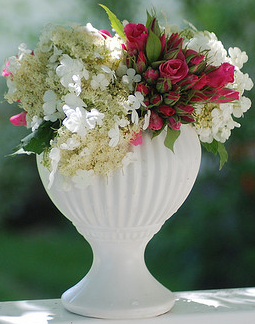

pred: vase
===


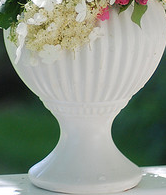

pred: vase
===


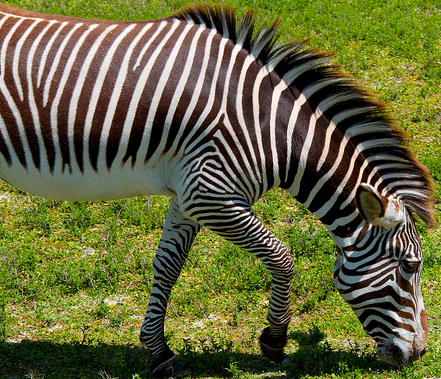

pred: zebra
===


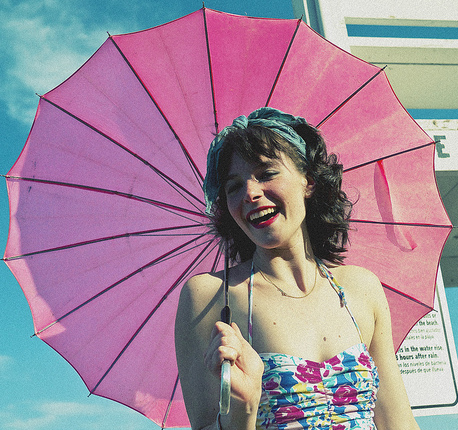

pred: umbrella
===


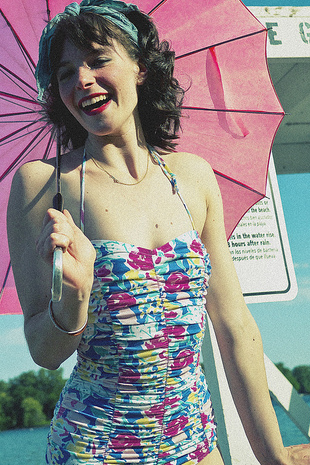

pred: umbrella
===


In [46]:
for cls_image_data, pred_cls_image_data in zip(cropped_images[10:15], pred_cls_images_data[10:15]):
    display(Image.fromarray(cls_image_data.open_image()))
    print(f"pred: {pred_cls_image_data.label}")
    print("===")

In [47]:
cls_images_data = [bbox_data for image_data in images_data for bbox_data in image_data.bboxes_data]

### Calculating Metrics

In [48]:
import tensorflow as tf
from tensorflow.keras.applications.mobilenet_v2 import MobileNetV2, decode_predictions, preprocess_input

mobilenet_model = MobileNetV2(weights='imagenet')
imagenet_class_names = [decoded[0][1] for decoded in decode_predictions(np.eye(1000), top=1)]

CLASSIFICATION_MODEL_SPEC = TensorFlow_ClassificationModelSpec(
    input_size=(224, 224),
    model_path=mobilenet_model,
    class_names=imagenet_class_names,
    preprocess_input=lambda images: preprocess_input(
        np.array([tf.image.resize(image, (224, 224)).numpy() for image in images], dtype=np.float32)
    ),
    saved_model_type='tf.keras.Model',
)

In [49]:
len(cls_images_data)

61

In [50]:
len(images_data)

10

In [51]:
len(pred_cls_images_data)

61

In [52]:
from cv_pipeliner import get_df_classification_metrics

df_classification_metrics = get_df_classification_metrics(
    n_true_bboxes_data=[cls_images_data],
    n_pred_bboxes_data=[pred_cls_images_data],
    pseudo_class_names=[],
    known_class_names=classification_inferencer.class_names,
)

In [53]:
df_classification_metrics

,support,precision,recall,f1_score,value,TP,FP,FN,known,pseudo
all_weighted_average_without_pseudo_classes,61.0,0.147541,0.081967,0.093365,NaN,5.0,56.0,56.0,NaN,NaN
all_accuracy,61.0,NaN,NaN,NaN,0.042735,5.0,56.0,56.0,NaN,NaN
all_macro_average_without_pseudo_classes,61.0,0.074074,0.063889,0.062081,NaN,5.0,56.0,56.0,NaN,NaN
all_micro_average_without_pseudo_classes,61.0,0.081967,0.081967,0.081967,NaN,5.0,56.0,56.0,NaN,NaN
all_accuracy_without_pseudo_classes,61.0,NaN,NaN,NaN,0.042735,5.0,56.0,56.0,NaN,NaN
all_weighted_average,61.0,0.147541,0.081967,0.093365,NaN,5.0,56.0,56.0,NaN,NaN
all_macro_average,61.0,0.074074,0.063889,0.062081,NaN,5.0,56.0,56.0,NaN,NaN
all_micro_average,61.0,0.081967,0.081967,0.081967,NaN,5.0,56.0,56.0,NaN,NaN
book,15.0,0.0,0.0,0.0,NaN,0.0,0.0,15.0,False,False
known_accuracy,14.0,NaN,NaN,NaN,0.071429,5.0,56.0,9.0,NaN,NaN


In [54]:
del classification_inferencer

# Pipeline

# How to Load a Pipeline Model, Run Inference, Visualize Results

### Loading the Model

In [55]:
from cv_pipeliner import PipelineModelSpec

In [56]:
PIPELINE_MODEL_SPEC = PipelineModelSpec(
    detection_model_spec=DETECTION_MODEL_SPEC,
    classification_model_spec=None
)

# You can also do this:
# PIPELINE_MODEL_SPEC = PipelineModelSpec(
#     detection_model_spec=DETECTION_MODEL_SPEC,
#     classification_model_spec=CLASSIFICATION_MODEL_SPEC
# )

### Loading the Inferencer and Running Inference

In [57]:
from cv_pipeliner import PipelineInferencer

In [58]:
pipeline_inferencer = PIPELINE_MODEL_SPEC.load_pipeline_inferencer()

In [59]:
pred_images_data_pipeline = pipeline_inferencer.predict(
    images_data_gen=images_data_gen, 
    detection_score_threshold=DETECTION_SCORE_THRESHOLD
)

  0%|                                                                                                             | 0/10 [00:00<?, ?it/s]

 30%|██████████████████████████████▎                                                                      | 3/10 [00:00<00:00, 16.69it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████▉          | 9/10 [00:00<00:00, 23.65it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 22.15it/s]

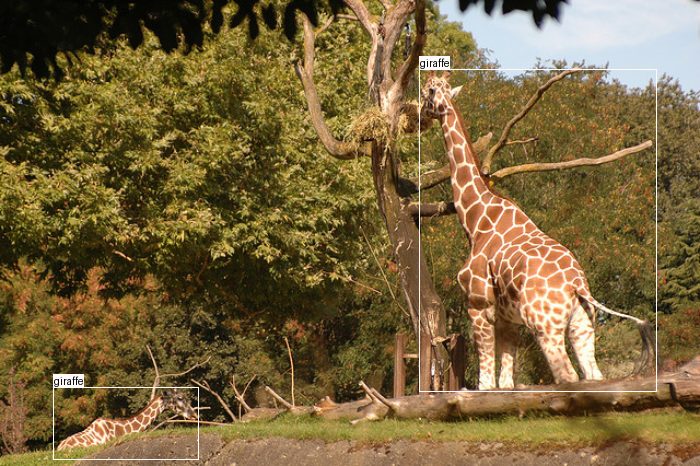

In [60]:
visualize_image_data(
    pred_images_data_pipeline[1], include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=1
)

### Calculating Metrics

In [61]:
from cv_pipeliner import get_df_pipeline_metrics

In [62]:
df_pipeline_metrics = get_df_pipeline_metrics(
    true_images_data=images_data,
    pred_images_data=pred_images_data_pipeline,
    minimum_iou=0.3,
    pseudo_class_names=['other_part', 'not_part', 'part_indefinable', 'no_such_part'],
    known_class_names=pipeline_inferencer.class_names
)

In [63]:
df_pipeline_metrics

,images_support,support,value,TP,FP,FN,TP (extra bbox),FP (extra bbox),FN (extra bbox),precision,recall,f1_score,known,pseudo
known_weighted_average_without_pseudo_classes,10.0,61.0,NaN,30.0,1.0,31.0,0.0,10.0,0.0,0.565574,0.491803,0.50929,NaN,NaN
known_accuracy,10.0,61.0,0.416667,30.0,1.0,31.0,0.0,10.0,0.0,NaN,NaN,NaN,NaN,NaN
all_iou_mean,NaN,61.0,0.601209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
all_micro_average,10.0,61.0,NaN,30.0,1.0,31.0,0.0,10.0,0.0,0.731707,0.491803,0.588235,NaN,NaN
all_macro_average,10.0,61.0,NaN,30.0,1.0,31.0,0.0,10.0,0.0,0.631944,0.572222,0.586905,NaN,NaN
all_weighted_average,10.0,61.0,NaN,30.0,1.0,31.0,0.0,10.0,0.0,0.565574,0.491803,0.50929,NaN,NaN
all_accuracy_without_pseudo_classes,10.0,61.0,0.416667,30.0,1.0,31.0,0.0,10.0,0.0,NaN,NaN,NaN,NaN,NaN
all_iou_mean_without_pseudo_classes,NaN,61.0,0.601209,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
all_micro_average_without_pseudo_classes,10.0,61.0,NaN,30.0,1.0,31.0,0.0,10.0,0.0,0.731707,0.491803,0.588235,NaN,NaN
all_macro_average_without_pseudo_classes,10.0,61.0,NaN,30.0,1.0,31.0,0.0,10.0,0.0,0.631944,0.572222,0.586905,NaN,NaN


# Segmentation (bbox + mask)

## YOLOv8 Pipeline with Segmentation

In [64]:
from cv_pipeliner import ImageData, PipelineModelSpec, YOLOv8_ModelSpec

In [65]:
SEGMENTATION_DETECTION_MODEL_SPEC = YOLOv8_ModelSpec(model_path='yolov8n-seg.pt')
SEGMENTATION_DETECTION_SCORE_THRESHOLD = 0.25

In [66]:
SEGMENTATION_PIPELINE_MODEL_SPEC = PipelineModelSpec(
    detection_model_spec=SEGMENTATION_DETECTION_MODEL_SPEC,
    classification_model_spec=None,
)

In [67]:
segmentation_pipeline_inferencer = SEGMENTATION_PIPELINE_MODEL_SPEC.load_pipeline_inferencer()

In [68]:
pred_segm_images_datas = segmentation_pipeline_inferencer.predict(
    images_data_gen=images_data_gen,
    detection_score_threshold=SEGMENTATION_DETECTION_SCORE_THRESHOLD,
)

  0%|                                                                                                             | 0/10 [00:00<?, ?it/s]

 30%|██████████████████████████████▎                                                                      | 3/10 [00:00<00:00,  9.78it/s]

 60%|████████████████████████████████████████████████████████████▌                                        | 6/10 [00:00<00:00, 13.01it/s]

 90%|██████████████████████████████████████████████████████████████████████████████████████████▉          | 9/10 [00:00<00:00, 15.21it/s]

100%|████████████████████████████████████████████████████████████████████████████████████████████████████| 10/10 [00:00<00:00, 13.90it/s]

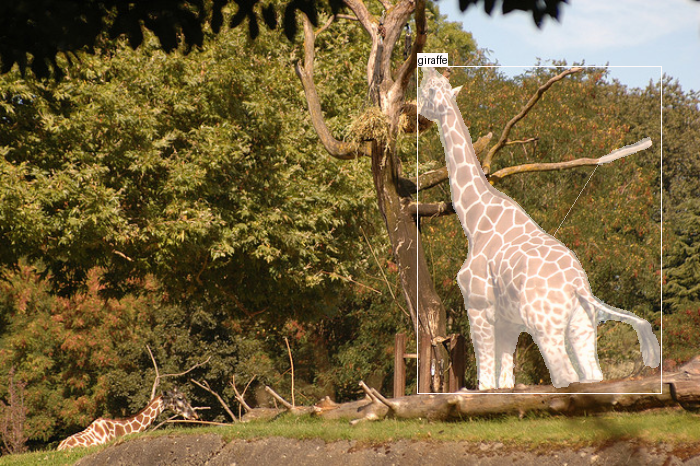

In [69]:
visualize_image_data(
    pred_segm_images_datas[1], include_labels=True, return_as_pil_image=True, thumbnail_size=700,
    fontsize=16, thickness=1, include_mask=True
)